![image](title.png)

In [10]:
#papckage load and 
library(muscat) 
library(Seurat)
library(patchwork)
library(SingleCellExperiment)
library(edgeR)
library(dplyr)

memory.limit(size=NA)
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 600)

Warning message:
“'memory.limit()' is Windows-specific”


[1] Inf

In [2]:
# For debugging purpose


In [3]:
# Seurat rds(after qc, clustering etc.)

#Load merged seurat object from RDS
Epi.combined <- readRDS(file = "ALL_combined_raw.rds")
#Make new col about sample batch
Epi.combined[['group_id']] <- lapply(list(Epi.combined@meta.data[,1]), function(x) substr(x,3,8))

#Make new col about sample batch and add mock cluster_id
H_L_Epi <- subset(Epi.combined, subset= group_id== 'H_Epi' | group_id== 'L_Epi')
H_L_Epi[['cluster_id']] <- '1'

In [6]:
#Use muscat's psuedo-bulk merge expression data
Epi.combined.sce <- as.SingleCellExperiment(H_L_Epi)
Epi.combined.sce <- prepSCE(Epi.combined.sce, 
                            kid = 'cluster_id', # subpopulation assignments
                            gid = "group_id",  # group IDs (ctrl/stim)
                            sid = "orig.ident")   # sample IDs (ctrl/stim.1234)

#Store dataframe
pb_sum <- aggregateData(Epi.combined.sce, fun = "sum", by=c('cluster_id','sample_id'), assay='counts')
df_pb_sum <- as.data.frame(assay(pb_sum))

In [7]:
#make compare matrix. 여기는 샘플별로 수정해야 함
group <- factor( c("H_Epi", "L_Epi", "H_Epi", "L_Epi", "H_Epi", "L_Epi") )
# construct design & contrast matrix
ei <- metadata(Epi.combined.sce)$experiment_info
mm <- model.matrix(~ 0 + ei$group_id)
dimnames(mm) <- list(ei$sample_id, levels(ei$group_id))
contrast <- makeContrasts("H_Epi-L_Epi", levels = mm) #여기는 샘플별로 수정해야 함

deg <- pbDS(pb_sum, design = mm, contrast = contrast, method = "edgeR")
deg_df <- deg$table$`H_Epi-L_Epi`$`1`
deg_df[grep('Lpl', deg_df$gene),]

1..

,gene,cluster_id,logFC,logCPM,F,p_val,p_adj.loc,p_adj.glb,contrast
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
7324,Lpl,1,5.313526,5.405513,502.4896,1.467482e-08,0.0001946043,0.0002039946,H_Epi-L_Epi


In [8]:
# deg결과임
deg_df

gene,cluster_id,logFC,logCPM,F,p_val,p_adj.loc,p_adj.glb,contrast
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
Mrpl15,1,0.340327529,5.7795229,9.715563e+00,0.014129484,0.05653755,1,H_Epi-L_Epi
Lypla1,1,0.063228310,5.4145348,7.474684e-01,0.412224220,0.55943853,1,H_Epi-L_Epi
Gm37988,1,0.178668234,-1.9228779,2.958051e-01,0.616705125,0.73712966,1,H_Epi-L_Epi
Tcea1,1,-0.208875907,6.8365483,5.071532e+00,0.054097821,0.13828893,1,H_Epi-L_Epi
Atp6v1h,1,0.011134158,6.1646426,3.768602e-03,0.952541735,0.97176594,1,H_Epi-L_Epi
Rb1cc1,1,-0.205726941,6.8343690,3.846243e+00,0.085165978,0.18744336,1,H_Epi-L_Epi
4732440D04Rik,1,-0.294311228,3.5025412,4.234081e+00,0.073298855,0.16991696,1,H_Epi-L_Epi
Pcmtd1,1,-0.202204253,6.8636457,5.239772e+00,0.051047171,0.13318445,1,H_Epi-L_Epi
Gm26901,1,-0.818945740,-0.7306501,9.011759e+00,0.016840223,0.06357158,1,H_Epi-L_Epi


,l_meta_sample,l_meta_tissue,l_meta_condition
,<chr>,<chr>,<chr>
2-H_Epi,2,Epi,H_Epi
2-L_Epi,2,Epi,L_Epi
3-H_Epi,3,Epi,H_Epi
3-L_Epi,3,Epi,L_Epi
4-H_Epi,4,Epi,H_Epi
4-L_Epi,4,Epi,L_Epi


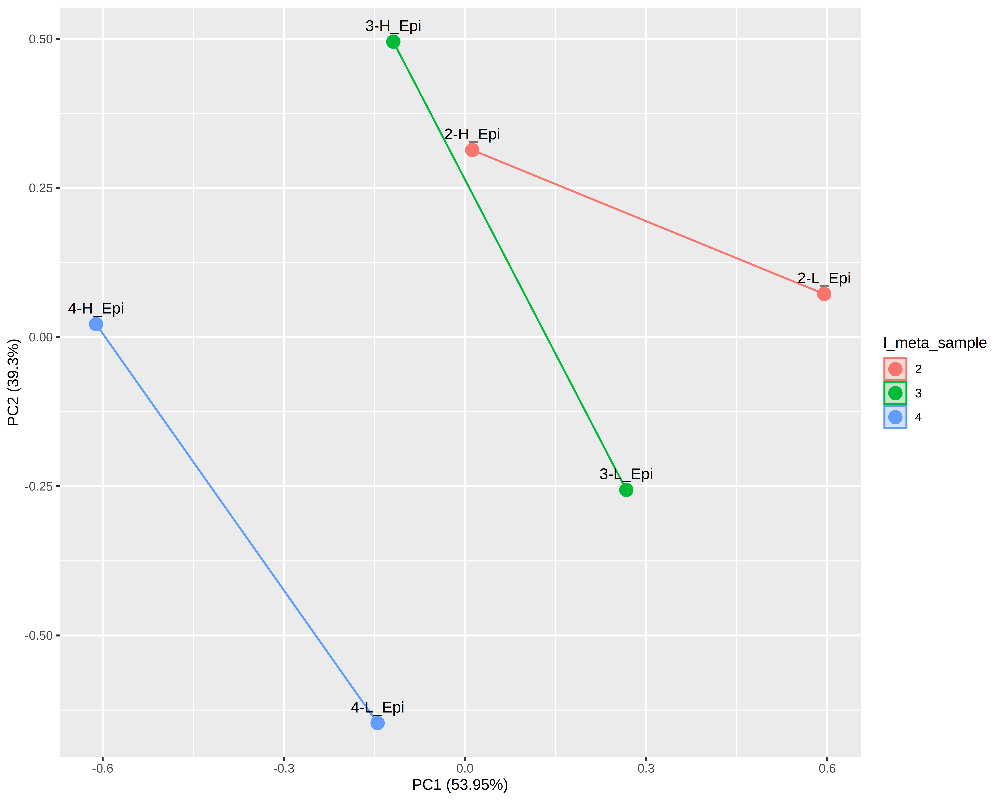

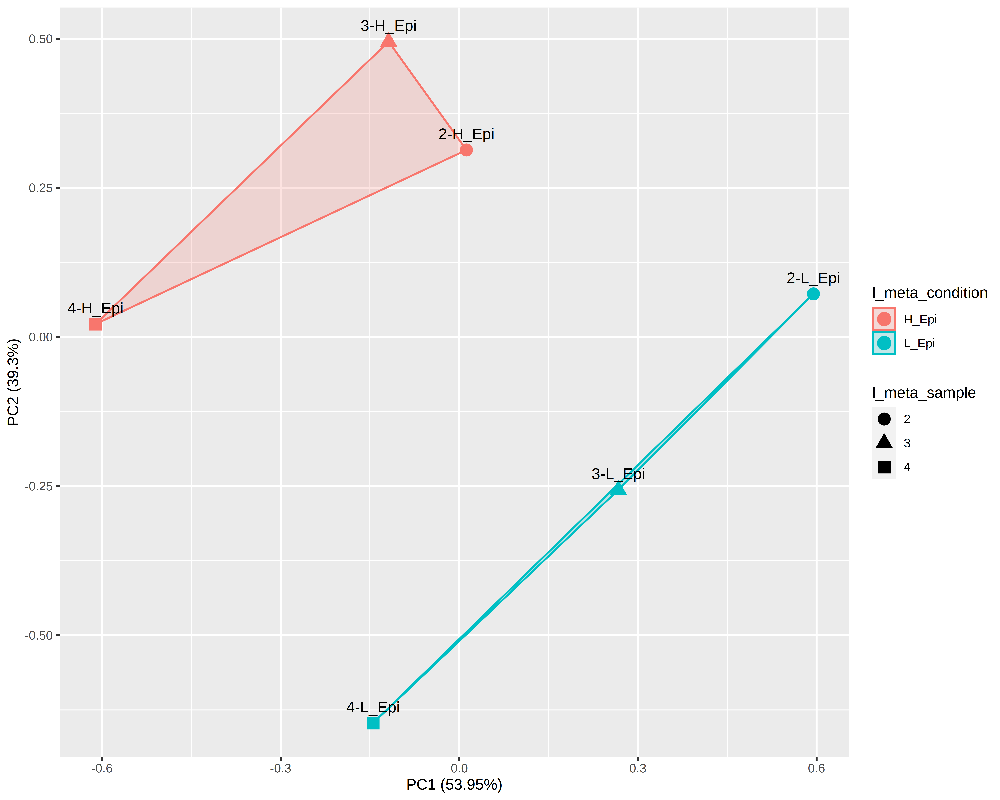

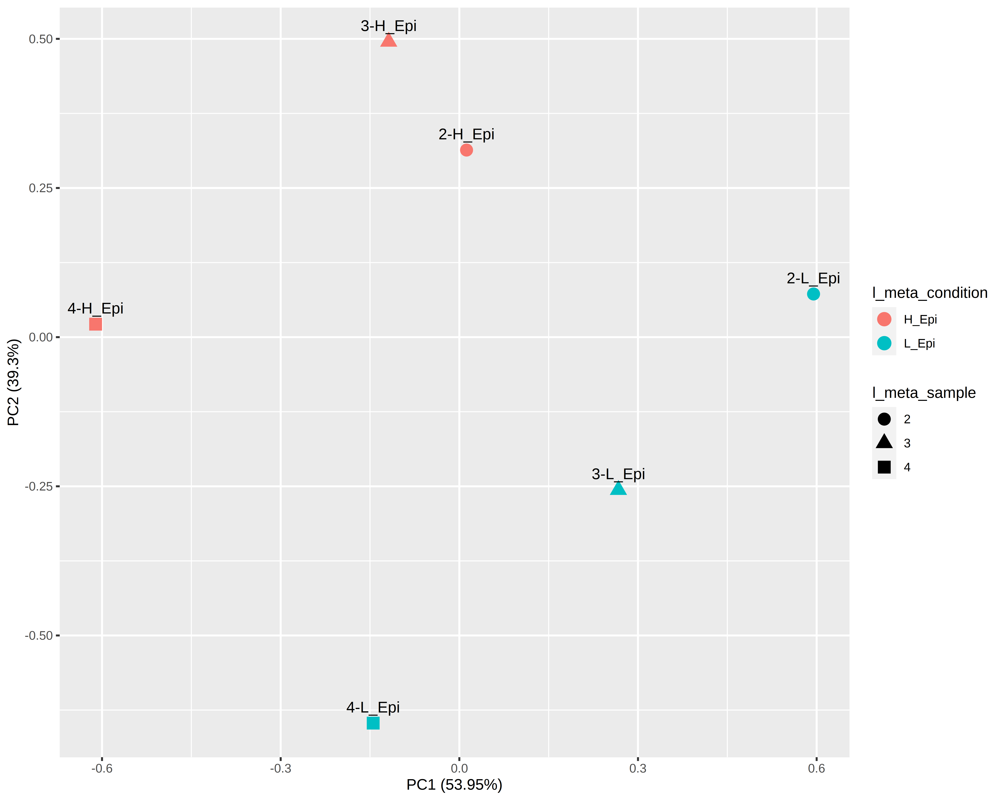

In [11]:
#Draw PCAplot
library(ggfortify)

pca <- prcomp(t(df_pb_sum), center=TRUE)

l_meta_sample = lapply(list(colnames(df_pb_sum)), function(x) substr(x,1,1))
l_meta_tissue = lapply(list(colnames(df_pb_sum)), function(x) substr(x,5,8))
l_meta_condition = lapply(list(colnames(df_pb_sum)), function(x) substr(x,3,8))
df_meta <- data.frame(l_meta_sample,l_meta_tissue, l_meta_condition)
rownames(df_meta) <- rownames(t(df_pb_sum))
colnames(df_meta) <- c('l_meta_sample','l_meta_tissue','l_meta_condition')
df_meta

autoplot(pca, data=df_meta, colour = 'l_meta_sample', size =4, frame = TRUE) + geom_text(vjust=-1, label=rownames(t(df_pb_sum)))

autoplot(pca, data=df_meta, colour = 'l_meta_condition',shape = 'l_meta_sample',size =4, frame = TRUE) + geom_text(vjust=-1, label=rownames(t(df_pb_sum)))

autoplot(pca, data=df_meta, colour = 'l_meta_condition',shape = 'l_meta_sample',size =4) + geom_text(vjust=-1, label=rownames(t(df_pb_sum)))

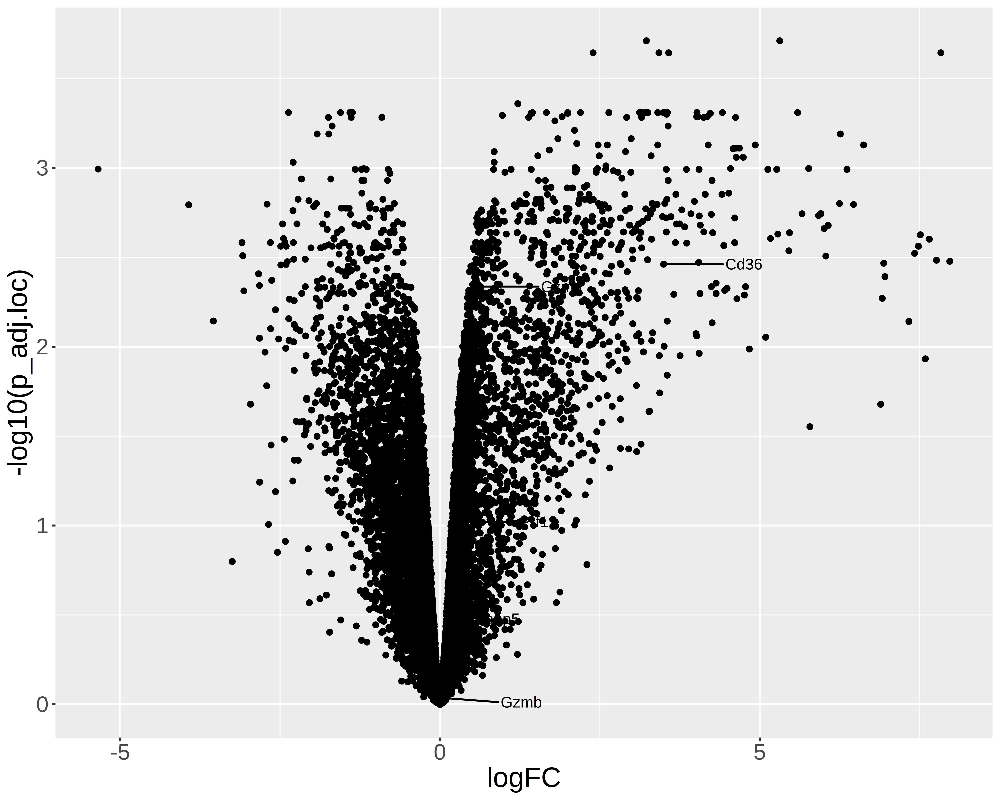

In [12]:
#volcanoPlot custom ver. 이건 안쓸듯?
library(ggrepel)
library(ggiraph)
library(ggplot2)

# redefine levels:(for labeling)
deg_df$genelabels <- factor(deg_df$gene, levels = c('Gzmb', 'Prf1', 'Gzma', 'Cpt1b', 'Fabp5', 'Fabp9',' Lpl', 'Cd36',' Fabp4'))

gg_point =  ggplot(data= deg_df, aes(x=logFC, y=-log10(p_adj.loc), label=genelabels))+
  geom_point()+
  geom_text_repel(col = "black", na.rm = TRUE, box.padding = unit(1.5, "lines"), hjust = 1) + 
  scale_color_manual(values = c("red", "black")) +
  theme(legend.title = element_blank(), text = element_text(size = 20))
gg_point

Registered S3 methods overwritten by 'ggalt':
  method                  from     
  fortify.table           ggfortify
  grid.draw.absoluteGrob  ggplot2  
  grobHeight.absoluteGrob ggplot2  
  grobWidth.absoluteGrob  ggplot2  
  grobX.absoluteGrob      ggplot2  
  grobY.absoluteGrob      ggplot2  



[1] 498 774

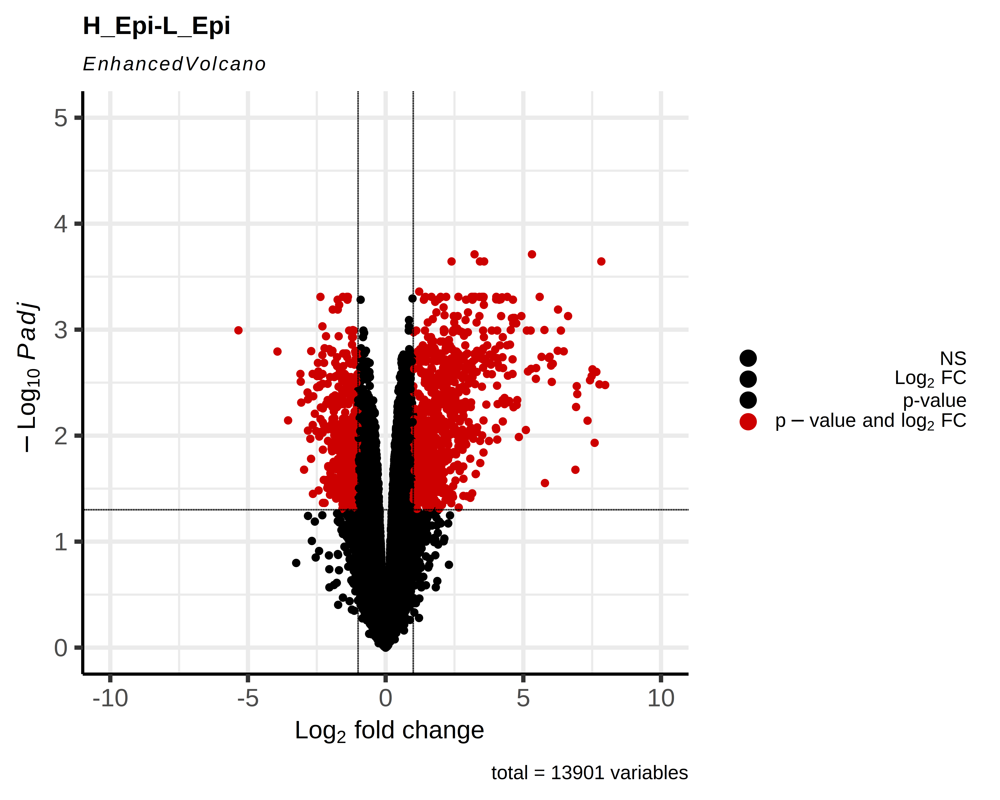

In [13]:
#Non-interative version using EnhancedVolcano
library(EnhancedVolcano)

EnhancedVolcano(deg_df,
                #lab = deg_df$gene,
                lab = '',
                x = 'logFC',
                y = 'p_adj.loc',
                ylab = bquote(~-Log[10] ~ italic(Padj)),
                pCutoff = 0.05,
                FCcutoff = 1,
                ylim = c(0, 5),
                xlim = c(-10,10),
                legendPosition = 'right',
                title= paste(colnames(mm)[1], '-', colnames(mm)[2], sep=''), #automatically generate title
                col=c('black', 'black', 'black', 'red3'),
                colAlpha = 1)

H_Epi_Up <- subset(deg_df, logFC > 1 & p_adj.loc<0.05)
H_Epi_Down <- subset(deg_df, logFC < -1 & p_adj.loc<0.05)
c(dim(H_Epi_Down)[1], dim(H_Epi_Up)[1])

In [18]:
#위에꺼 interative version
g_enh <- EnhancedVolcano(deg_df,
                #lab = deg_df$gene,
                lab = '',
                x = 'logFC',
                y = 'p_adj.loc',
                ylab = bquote(~-Log[10] ~ italic(Padj)),
                pCutoff = 0.05,
                FCcutoff = 1,
                ylim = c(0, 5),
                xlim = c(-10,10),
                legendPosition = 'right',
                title= paste(colnames(mm)[1], '-', colnames(mm)[2], sep=''), #automatically generate title
                col=c('black', 'black', 'black', 'red3'),
                colAlpha = 1) 

tooltip <- c(paste0("gene = ", deg_df$gene, "\n logFC = ", round(deg_df$logFC, 4), "\n p_adj.loc = ", round(deg_df$p_adj.loc, 4)))
g_enh <- g_enh + geom_point_interactive(aes(x=logFC, y=-log10(p_adj.loc), tooltip= tooltip, data_id= gene), alpha= 0.1)
x <- girafe(ggobj = g_enh,
       pointsize = 6,
       width_svg = 12,
       height_svg = 10)

x <- girafe_options(x,
  opts_sizing(rescale = FALSE) )

x

HTML widgets cannot be represented in plain text (need html)

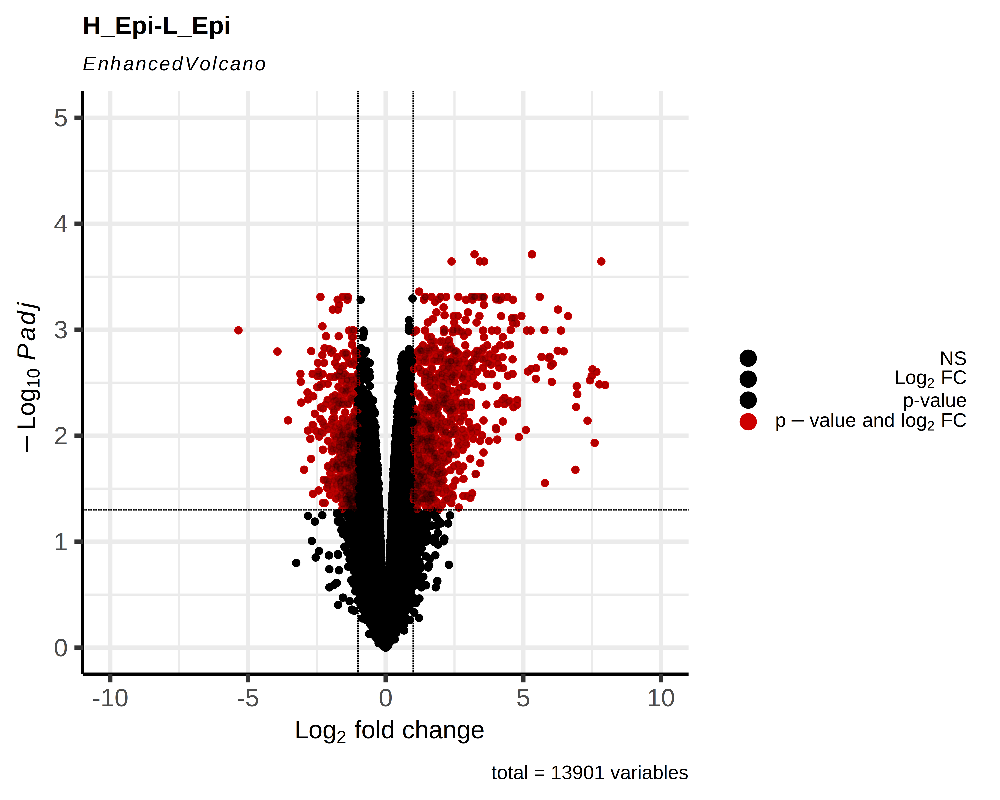

In [21]:
#Save it as html(interactive_ver)
g_enh
htmlwidgets::saveWidget(file="L_EpivsH_Epi.html",
                        girafe(ggobj = g_enh,
                        pointsize = 6,
                        width_svg = 12,
                        height_svg = 10))

Warning message:
“`filter_()` was deprecated in dplyr 0.7.0.
Please use `filter()` instead.
See vignette('programming') for more help
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”


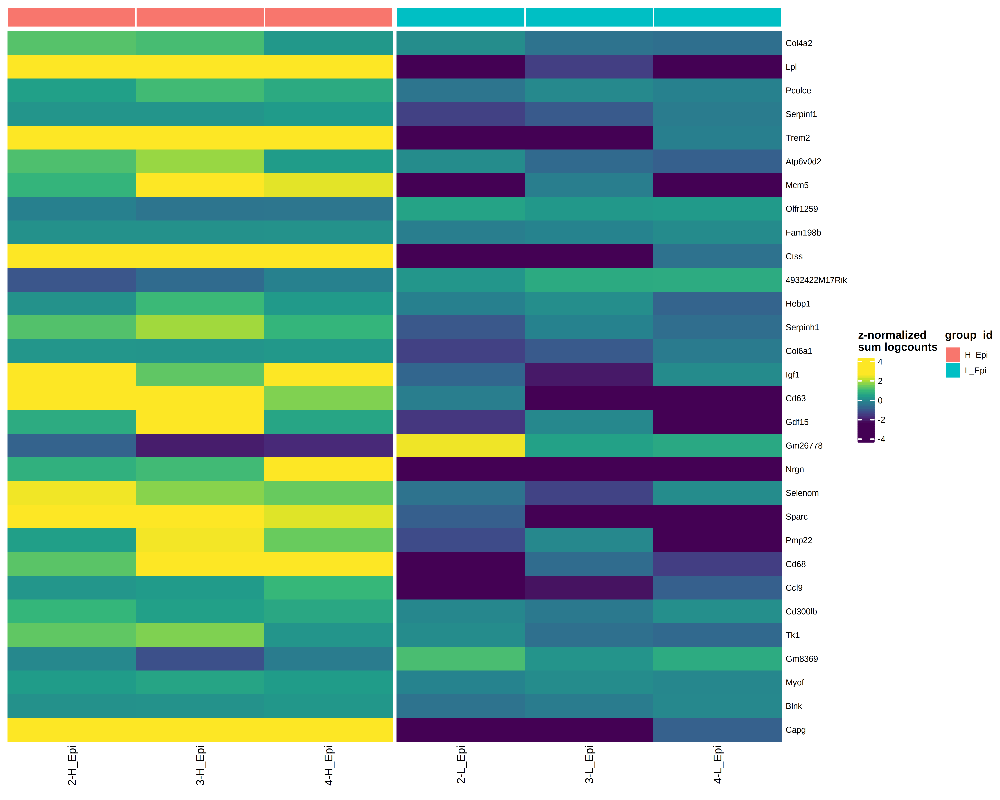

In [22]:
#Draw heatmap
pbHeatmap(Epi.combined.sce, deg, top_n = 30, fun=sum)

In [ ]:
#deg들 tsv로 저장하기
H_Epi_Up <- subset(test, logFC > 0.6 & p_adj.loc<0.05)
H_Epi_Up_top500 <- H_Epi_Up[order(H_Epi_Up$p_adj.loc),][1:500,]
H_Epi_Up_top500$gene
write.table(H_Epi_Up_top500, 'H_Epi_Up.tsv')

H_Epi_Down <- subset(test, logFC < -0.6& p_adj.loc<0.05)
H_Epi_Down_top100 <- H_Epi_Down[order(H_Epi_Down$p_adj.loc),][1:500,]
H_Epi_Down_top100$gene
write.table(H_Epi_Down_top100, 'H_Epi_Down.tsv')

In [ ]:
#Go-term 분석은 Metascape로 ㄱㄱ
https://metascape.org/gp/index.html

In [ ]:
#버릴거 백업


In [74]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /home/minho2/anaconda3-2020.11/envs/muscat/lib/libopenblasp-r0.3.12.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] EnhancedVolcano_1.8.0       gdtools_0.2.2              
 [3] ggiraph_0.7.8               ggrepel_0.9.1              
 [5] ggplot2_3.3.3               dplyr_1.0.5                
 [7] edgeR_3.32.1                limma_3.46.0               
 [9] SingleCellExperiment_